# ---------- Weekdays vs weekends analysis notebook ----------

The goal of this notebook is to build two networks: one for weekdays and one for weekends. Then, the stationary distribution is computed for each network in order to identify the most important stations.

Author: Artur Werys

In [1]:
from pathlib import Path

import pandas as pd
import numpy as np
import seaborn as sns


import networkx as nx

import matplotlib.pyplot as plt

import geopandas as gpd
import contextily as ctx

/Users/artur/Studia/Rowerki/.venv/lib/python3.9/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


In [2]:
BASE_DIR = Path(".")
DATA_DIR = BASE_DIR / "Data"

DATA_FILE = DATA_DIR / "final_trip_data.parquet"

padding = 2800


In [3]:
trip_data = pd.read_parquet(DATA_FILE)
trip_data.head()

,trip_id,start_date,start_station_id,start_station_name,end_date,end_station_id,end_station_name,bike_id,bike_model,total_duration,total_duration_ms,start_lat,start_lon,end_lat,end_lon
0,145207079,2024-12-14 23:59:00,300083,"Duke Street Hill, London Bridge",2024-12-14 23:59:00,300083.0,"Duke Street Hill, London Bridge",57763.0,CLASSIC,29s,29203.0,51.50630441,-0.087262995,51.50630441,-0.087262995
1,145207080,2024-12-14 23:59:00,1133,"Baylis Road, Waterloo",2024-12-15 00:26:00,200011.0,"Furze Green, Bow",62625.0,PBSC_EBIKE,27m 0s,1620164.0,51.50144456,-0.110699309,51.519265,-0.021345
2,145207081,2024-12-14 23:59:00,3447,"Gloucester Road (North), Kensington",2024-12-15 00:17:00,200181.0,"Richmond Way, Shepherd's Bush",62291.0,PBSC_EBIKE,18m 16s,1096981.0,51.49792478,-0.183834706,51.50035306,-0.217515071
3,145207082,2024-12-14 23:59:00,1112,"Nutford Place, Marylebone",2024-12-15 00:12:00,3422.0,"Charlbert Street, St. John's Wood",50575.0,CLASSIC,13m 3s,783763.0,51.5165179,-0.164393768,51.53430039,-0.1680743
4,145207083,2024-12-14 23:59:00,1122,"Ashley Place, Victoria",2024-12-15 00:04:00,200048.0,"Page Street, Westminster",52143.0,CLASSIC,5m 22s,322155.0,51.49616092,-0.140947636,51.493978,-0.127554


In [4]:
trip_data["start_day_of_week"] = trip_data["start_date"].dt.day_name()
trip_data.head()

,trip_id,start_date,start_station_id,start_station_name,end_date,end_station_id,end_station_name,bike_id,bike_model,total_duration,total_duration_ms,start_lat,start_lon,end_lat,end_lon,start_day_of_week
0,145207079,2024-12-14 23:59:00,300083,"Duke Street Hill, London Bridge",2024-12-14 23:59:00,300083.0,"Duke Street Hill, London Bridge",57763.0,CLASSIC,29s,29203.0,51.50630441,-0.087262995,51.50630441,-0.087262995,Saturday
1,145207080,2024-12-14 23:59:00,1133,"Baylis Road, Waterloo",2024-12-15 00:26:00,200011.0,"Furze Green, Bow",62625.0,PBSC_EBIKE,27m 0s,1620164.0,51.50144456,-0.110699309,51.519265,-0.021345,Saturday
2,145207081,2024-12-14 23:59:00,3447,"Gloucester Road (North), Kensington",2024-12-15 00:17:00,200181.0,"Richmond Way, Shepherd's Bush",62291.0,PBSC_EBIKE,18m 16s,1096981.0,51.49792478,-0.183834706,51.50035306,-0.217515071,Saturday
3,145207082,2024-12-14 23:59:00,1112,"Nutford Place, Marylebone",2024-12-15 00:12:00,3422.0,"Charlbert Street, St. John's Wood",50575.0,CLASSIC,13m 3s,783763.0,51.5165179,-0.164393768,51.53430039,-0.1680743,Saturday
4,145207083,2024-12-14 23:59:00,1122,"Ashley Place, Victoria",2024-12-15 00:04:00,200048.0,"Page Street, Westminster",52143.0,CLASSIC,5m 22s,322155.0,51.49616092,-0.140947636,51.493978,-0.127554,Saturday


In [5]:
trip_data_weekends = trip_data[trip_data["start_day_of_week"].isin(["Saturday", "Sunday"])]
trip_data_weekdays = trip_data[trip_data["start_day_of_week"].isin(["Monday", "Tuesday", "Wednesday", "Thursday", "Friday"])]

In [6]:
trip_data_weekends.head()

,trip_id,start_date,start_station_id,start_station_name,end_date,end_station_id,end_station_name,bike_id,bike_model,total_duration,total_duration_ms,start_lat,start_lon,end_lat,end_lon,start_day_of_week
0,145207079,2024-12-14 23:59:00,300083,"Duke Street Hill, London Bridge",2024-12-14 23:59:00,300083.0,"Duke Street Hill, London Bridge",57763.0,CLASSIC,29s,29203.0,51.50630441,-0.087262995,51.50630441,-0.087262995,Saturday
1,145207080,2024-12-14 23:59:00,1133,"Baylis Road, Waterloo",2024-12-15 00:26:00,200011.0,"Furze Green, Bow",62625.0,PBSC_EBIKE,27m 0s,1620164.0,51.50144456,-0.110699309,51.519265,-0.021345,Saturday
2,145207081,2024-12-14 23:59:00,3447,"Gloucester Road (North), Kensington",2024-12-15 00:17:00,200181.0,"Richmond Way, Shepherd's Bush",62291.0,PBSC_EBIKE,18m 16s,1096981.0,51.49792478,-0.183834706,51.50035306,-0.217515071,Saturday
3,145207082,2024-12-14 23:59:00,1112,"Nutford Place, Marylebone",2024-12-15 00:12:00,3422.0,"Charlbert Street, St. John's Wood",50575.0,CLASSIC,13m 3s,783763.0,51.5165179,-0.164393768,51.53430039,-0.1680743,Saturday
4,145207083,2024-12-14 23:59:00,1122,"Ashley Place, Victoria",2024-12-15 00:04:00,200048.0,"Page Street, Westminster",52143.0,CLASSIC,5m 22s,322155.0,51.49616092,-0.140947636,51.493978,-0.127554,Saturday


In [7]:
trip_data_weekdays.head()

,trip_id,start_date,start_station_id,start_station_name,end_date,end_station_id,end_station_name,bike_id,bike_model,total_duration,total_duration_ms,start_lat,start_lon,end_lat,end_lon,start_day_of_week
17963,145188626,2024-12-13 23:59:00,200068,"Somerset House, Strand",2024-12-14 00:14:00,22160.0,"Chelsea Bridge, Pimlico",62159.0,PBSC_EBIKE,15m 10s,910023.0,51.509943,-0.117619,51.485821,-0.149004,Friday
17964,145188627,2024-12-13 23:59:00,1160,"Craven Street, Strand",2024-12-14 00:25:00,2690.0,"City Road, Angel",56153.0,CLASSIC,26m 37s,1597200.0,51.50810309,-0.12602103,51.530344,-0.100168,Friday
17965,145188628,2024-12-13 23:59:00,1065,"Aldersgate Street, Barbican",2024-12-14 00:06:00,1083.0,"Commercial Street, Shoreditch",63429.0,PBSC_EBIKE,7m 10s,430060.0,51.5208417,-0.097340162,51.52127071,-0.0755789,Friday
17966,145188629,2024-12-13 23:59:00,973,"Bethnal Green Road, Shoreditch",2024-12-14 00:03:00,3430.0,"Central House, Aldgate",57913.0,CLASSIC,4m 36s,276712.0,51.52364804,-0.074754872,51.515231,-0.07015,Friday
17967,145188630,2024-12-13 23:59:00,1182,"Notting Hill Gate Station, Notting Hill",2024-12-14 00:02:00,2682.0,"Turquoise Island, Notting Hill",55690.0,CLASSIC,2m 33s,153691.0,51.50935342,-0.196422,51.51431171,-0.200838199,Friday


# Weekends network building

In [8]:
start_stations_weekends_df = trip_data[
    [
        "start_station_id",
        "start_station_name",
        "start_lat",
        "start_lon",
    ]
].drop_duplicates()

start_stations_weekends_df = start_stations_weekends_df.rename(columns={
    "start_station_id": "station_id",
    "start_station_name": "station_name",
    "start_lat": "lat",
    "start_lon": "lon"
})

start_stations_weekends_df.head()

,station_id,station_name,lat,lon
0,300083,"Duke Street Hill, London Bridge",51.50630441,-0.087262995
1,1133,"Baylis Road, Waterloo",51.50144456,-0.110699309
2,3447,"Gloucester Road (North), Kensington",51.49792478,-0.183834706
3,1112,"Nutford Place, Marylebone",51.5165179,-0.164393768
4,1122,"Ashley Place, Victoria",51.49616092,-0.140947636


In [9]:
end_stations_weekends_df = trip_data[
    [
        "end_station_id",
        "end_station_name",
        "end_lat",
        "end_lon",
    ]
].drop_duplicates()

end_stations_weekends_df = end_stations_weekends_df.rename(columns={
    "end_station_id": "station_id",
    "end_station_name": "station_name",
    "end_lat": "lat",
    "end_lon": "lon"
})

end_stations_weekends_df.head()

,station_id,station_name,lat,lon
0,300083.0,"Duke Street Hill, London Bridge",51.50630441,-0.087262995
1,200011.0,"Furze Green, Bow",51.519265,-0.021345
2,200181.0,"Richmond Way, Shepherd's Bush",51.50035306,-0.217515071
3,3422.0,"Charlbert Street, St. John's Wood",51.53430039,-0.1680743
4,200048.0,"Page Street, Westminster",51.493978,-0.127554


In [10]:
stations_weekends_df = pd.concat([start_stations_weekends_df, end_stations_weekends_df], ignore_index=True).drop_duplicates()
print("Number of stations:", len(stations_weekends_df))

Number of stations: 801


In [11]:
edges_weekends_df = trip_data_weekends.groupby(
    [
        "start_station_id",
        "start_station_name",
        "end_station_id",
        "end_station_name"
    ]
).agg(
    weight=("start_station_id", "count")
).reset_index()

In [12]:
graph_weekends = nx.from_pandas_edgelist(
    edges_weekends_df,
    source="start_station_name",
    target="end_station_name",
    edge_attr="weight",
    create_using=nx.DiGraph()
)

## Weekend Markov 

In [13]:
positions = {}

for _, row in stations_weekends_df.iterrows():

    positions[row["station_name"]] = (
        row["lon"],
        row["lat"]
    )

station_to_index = {
    station_id: idx
    for idx, station_id in enumerate(
        sorted(stations_weekends_df["station_id"].unique())
    )
}

index_to_station = {
    idx: station_id
    for station_id, idx in station_to_index.items()
}

In [14]:
N = len(stations_weekends_df["station_id"].unique())

wij_matrix = np.zeros((N, N))


for _, row in edges_weekends_df.iterrows():

        start_station = row["start_station_id"]
        end_station = row["end_station_id"]
        weight = row["weight"]

        i = station_to_index[start_station]
        j = station_to_index[end_station]


        wij_matrix[i][j] = weight

In [15]:
wik_sum = wij_matrix.sum(axis=1)
wik_sum = wik_sum.reshape((-1, 1))

In [16]:
Pij_matrix = wij_matrix / wik_sum
Pij_matrix.sum(axis=1)

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1.

In [17]:
p_t0_matrix = np.zeros((1, N))
p_t0_matrix[0, :] = 1/N
print(p_t0_matrix)

[[0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.

In [18]:
p_t1_matrix = np.zeros((1, N))

diff = abs(p_t1_matrix - p_t0_matrix). sum()
iteration = 0

while diff > 1e-10:
    p_t1_matrix = p_t0_matrix @ Pij_matrix
    diff = abs(p_t1_matrix - p_t0_matrix). sum()
    p_t0_matrix = p_t1_matrix
    iteration += 1

print(iteration)

stationary_distribution = p_t1_matrix


94


/var/folders/8p/j63xl3c17439n25jbp9cyjg40000gn/T/ipykernel_6347/1739673432.py:7: RuntimeWarning: divide by zero encountered in matmul
  p_t1_matrix = p_t0_matrix @ Pij_matrix
/var/folders/8p/j63xl3c17439n25jbp9cyjg40000gn/T/ipykernel_6347/1739673432.py:7: RuntimeWarning: overflow encountered in matmul
  p_t1_matrix = p_t0_matrix @ Pij_matrix
/var/folders/8p/j63xl3c17439n25jbp9cyjg40000gn/T/ipykernel_6347/1739673432.py:7: RuntimeWarning: invalid value encountered in matmul
  p_t1_matrix = p_t0_matrix @ Pij_matrix


In [19]:
sorted_indices = np.argsort(stationary_distribution[0])[::-1]
sorted_probs = stationary_distribution[0][sorted_indices]

top_10_weekend_stations = sorted_indices[:10]
top_10_weekend_probs = sorted_probs[:10]

print("--- Top 10 stations on weekends: ---")


for idx, prob in zip(top_10_weekend_stations, top_10_weekend_probs):

    station_id = index_to_station[idx]

    station_name = stations_weekends_df[stations_weekends_df["station_id"] == station_id]["station_name"].values[0]

    print(station_name)


--- Top 10 stations on weekends: ---
Hyde Park Corner, Hyde Park
Albert Gate, Hyde Park
Black Lion Gate, Kensington Gardens
Hop Exchange, The Borough
Serpentine Car Park, Hyde Park
Battersea Power Station, Battersea Park
Triangle Car Park, Hyde Park
Westminster Pier, Westminster
Battersea Park Road, Nine Elms
Wellington Arch, Hyde Park


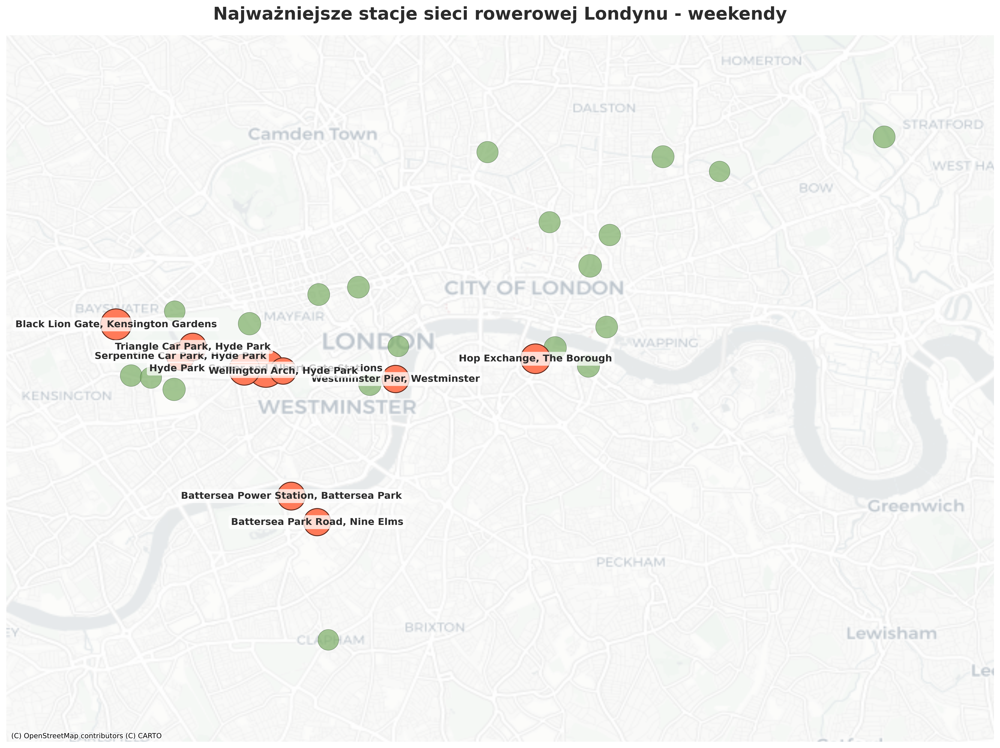

In [20]:
# ---------- Top 30 stations ----------

top_30_weekend_indices = sorted_indices[:30]

top_30_weekend_names = []

for idx in top_30_weekend_indices:

    station_id = index_to_station[idx]

    station_name = stations_weekends_df[
        stations_weekends_df["station_id"] == station_id
    ]["station_name"].values[0]

    top_30_weekend_names.append(station_name)


# ---------- Top 10 stations ----------

top_10_weekend_names = []

for idx in top_10_weekend_stations:

    station_id = index_to_station[idx]

    station_name = stations_weekends_df[
        stations_weekends_df["station_id"] == station_id
    ]["station_name"].values[0]

    top_10_weekend_names.append(station_name)


# ---------- Filtering strongest edges ----------

min_weight = 400

filtered_edges_df = edges_weekends_df[
    (edges_weekends_df["start_station_name"] != edges_weekends_df["end_station_name"]) &
    (edges_weekends_df["weight"] >= min_weight)
].copy()


# ---------- Building filtered graph ----------

filtered_graph = nx.from_pandas_edgelist(
    filtered_edges_df,
    source="start_station_name",
    target="end_station_name",
    edge_attr="weight",
    create_using=nx.DiGraph()
)


# ---------- GeoDataFrame ----------

stations_weekends_df["lat"] = stations_weekends_df["lat"].astype(float)
stations_weekends_df["lon"] = stations_weekends_df["lon"].astype(float)

geo_df = gpd.GeoDataFrame(
    stations_weekends_df,
    geometry=gpd.points_from_xy(
        stations_weekends_df["lon"],
        stations_weekends_df["lat"]
    ),
    crs="EPSG:4326"
)

geo_df = geo_df.to_crs(epsg=3857)


# ---------- Positions in EPSG:3857 ----------

positions_3857 = {}

for _, row in geo_df.iterrows():

    positions_3857[row["station_name"]] = (
        row.geometry.x,
        row.geometry.y
    )


# ---------- Stationary distribution dictionary ----------

stationary_dict = {}

for idx, probability in enumerate(stationary_distribution[0]):

    station_id = index_to_station[idx]

    station_name = stations_weekends_df[
        stations_weekends_df["station_id"] == station_id
    ]["station_name"].values[0]

    stationary_dict[station_name] = probability


# ---------- Node sizes proportional to stationary distribution ----------

top_30_node_sizes = [
    200 + 120000 * stationary_dict[node]
    for node in top_30_weekend_names
]

top_10_node_sizes = [
    300 + 150000 * stationary_dict[node]
    for node in top_10_weekend_names
]


# ---------- Labels ----------

labels_to_skip = [
    "Waterloo Station 1, Waterloo",
    "Albert Gate, Hyde Park"
]


labels = {}

for node in top_10_weekend_names:

    if node in labels_to_skip:
        continue

    elif node == "Waterloo Station 3, Waterloo":
        labels[node] = "Waterloo Stations"
    elif node == "Hyde Park Corner, Hyde Park":
        labels[node] = "Hyde Park Corner and Albert Gate Stations"
    else:
        labels[node] = node


# ---------- Plot style ----------

plt.rcParams["font.family"] = "DejaVu Sans"
plt.rcParams["axes.titlesize"] = 20
plt.rcParams["axes.titleweight"] = "bold"


# ---------- Drawing ----------

fig, ax = plt.subplots(figsize=(16, 12), dpi=250)


# Top 30 stations

nx.draw_networkx_nodes(
    filtered_graph,
    positions_3857,
    nodelist=top_30_weekend_names,
    node_size=top_30_node_sizes,
    node_color="#7FB069",
    alpha=0.72,
    edgecolors="#2F4F2F",
    linewidths=0.35,
    ax=ax
)


# Top 10 stations highlighted

nx.draw_networkx_nodes(
    filtered_graph,
    positions_3857,
    nodelist=top_10_weekend_names,
    node_size=top_10_node_sizes,
    node_color="#FF7A59",
    alpha=1.0,
    edgecolors="#5A2418",
    linewidths=1.0,
    ax=ax
)


# Labels for selected top 10 stations

text_items = nx.draw_networkx_labels(
    filtered_graph,
    positions_3857,
    labels=labels,
    font_size=11,
    font_weight="bold",
    font_color="#2b2b2b",
    font_family="DejaVu Sans",
    ax=ax
)

for _, text in text_items.items():

    text.set_bbox(
        dict(
            facecolor="white",
            edgecolor="none",
            alpha=0.75,
            boxstyle="round,pad=0.25"
        )
    )


# ---------- Map extent ----------

x_values = [
    positions_3857[node][0]
    for node in top_30_weekend_names
]

y_values = [
    positions_3857[node][1]
    for node in top_30_weekend_names
]

ax.set_xlim(
    min(x_values) - padding,
    max(x_values) + padding
)

ax.set_ylim(
    min(y_values) - padding,
    max(y_values) + padding
)


# ---------- Basemap ----------

ctx.add_basemap(
    ax,
    source=ctx.providers.CartoDB.Positron
)

for image in ax.get_images():
    image.set_alpha(0.58)


# ---------- Title ----------

ax.set_title(
    "Najważniejsze stacje sieci rowerowej Londynu - weekendy",
    color="#2b2b2b",
    pad=18
)

plt.axis("off")
plt.tight_layout()
plt.show()

## Weekdays network

In [21]:
start_stations_weekdays_df = trip_data[
    [
        "start_station_id",
        "start_station_name",
        "start_lat",
        "start_lon",
    ]
].drop_duplicates()

start_stations_weekdays_df = start_stations_weekdays_df.rename(columns={
    "start_station_id": "station_id",
    "start_station_name": "station_name",
    "start_lat": "lat",
    "start_lon": "lon"
})

start_stations_weekdays_df.head()

,station_id,station_name,lat,lon
0,300083,"Duke Street Hill, London Bridge",51.50630441,-0.087262995
1,1133,"Baylis Road, Waterloo",51.50144456,-0.110699309
2,3447,"Gloucester Road (North), Kensington",51.49792478,-0.183834706
3,1112,"Nutford Place, Marylebone",51.5165179,-0.164393768
4,1122,"Ashley Place, Victoria",51.49616092,-0.140947636


In [22]:
end_stations_weekdays_df = trip_data[
    [
        "end_station_id",
        "end_station_name",
        "end_lat",
        "end_lon",
    ]
].drop_duplicates()

end_stations_weekdays_df = end_stations_weekdays_df.rename(columns={
    "end_station_id": "station_id",
    "end_station_name": "station_name",
    "end_lat": "lat",
    "end_lon": "lon"
})

end_stations_weekdays_df.head()

,station_id,station_name,lat,lon
0,300083.0,"Duke Street Hill, London Bridge",51.50630441,-0.087262995
1,200011.0,"Furze Green, Bow",51.519265,-0.021345
2,200181.0,"Richmond Way, Shepherd's Bush",51.50035306,-0.217515071
3,3422.0,"Charlbert Street, St. John's Wood",51.53430039,-0.1680743
4,200048.0,"Page Street, Westminster",51.493978,-0.127554


In [23]:
stations_weekdays_df = pd.concat([start_stations_weekdays_df, end_stations_weekdays_df], ignore_index=True).drop_duplicates()
print("Number of stations:", len(stations_weekdays_df))

Number of stations: 801


In [24]:
edges_weekdays_df = trip_data_weekdays.groupby(
    [
        "start_station_id",
        "start_station_name",
        "end_station_id",
        "end_station_name"
    ]
).agg(
    weight=("start_station_id", "count")
).reset_index()

In [25]:
graph_weekdays = nx.from_pandas_edgelist(
    edges_weekdays_df,
    source="start_station_name",
    target="end_station_name",
    edge_attr="weight",
    create_using=nx.DiGraph()
)
    
positions = {}

stations_weekdays_df["lat"] = stations_weekdays_df["lat"].astype(float)
stations_weekdays_df["lon"] = stations_weekdays_df["lon"].astype(float)

for _, row in stations_weekdays_df.iterrows():

    positions[row["station_name"]] = (
        row["lon"],
        row["lat"]
    )

## Weekdays Markov

In [26]:
positions = {}

for _, row in stations_weekdays_df.iterrows():

    positions[row["station_name"]] = (
        row["lon"],
        row["lat"]
    )

station_to_index = {
    station_id: idx
    for idx, station_id in enumerate(
        sorted(stations_weekdays_df["station_id"].unique())
    )
}

index_to_station = {
    idx: station_id
    for station_id, idx in station_to_index.items()
}

In [27]:
N = len(stations_weekdays_df["station_id"].unique())

wij_matrix = np.zeros((N, N))


for _, row in edges_weekdays_df.iterrows():

        start_station = row["start_station_id"]
        end_station = row["end_station_id"]
        weight = row["weight"]

        i = station_to_index[start_station]
        j = station_to_index[end_station]


        wij_matrix[i][j] = weight

In [28]:
wik_sum = wij_matrix.sum(axis=1)
wik_sum = wik_sum.reshape((-1, 1))

In [29]:
Pij_matrix = wij_matrix / wik_sum
Pij_matrix.sum(axis=1)

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1.

In [30]:
p_t0_matrix = np.zeros((1, N))
p_t0_matrix[0, :] = 1/N
print(p_t0_matrix)

[[0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.00124844 0.00124844
  0.00124844 0.00124844 0.00124844 0.00124844 0.

In [31]:
p_t1_matrix = np.zeros((1, N))

diff = abs(p_t1_matrix - p_t0_matrix). sum()
iteration = 0

while diff > 1e-10:
    p_t1_matrix = p_t0_matrix @ Pij_matrix
    diff = abs(p_t1_matrix - p_t0_matrix). sum()
    p_t0_matrix = p_t1_matrix
    iteration += 1

print(iteration)

stationary_distribution = p_t1_matrix


74


/var/folders/8p/j63xl3c17439n25jbp9cyjg40000gn/T/ipykernel_6347/1739673432.py:7: RuntimeWarning: divide by zero encountered in matmul
  p_t1_matrix = p_t0_matrix @ Pij_matrix
/var/folders/8p/j63xl3c17439n25jbp9cyjg40000gn/T/ipykernel_6347/1739673432.py:7: RuntimeWarning: overflow encountered in matmul
  p_t1_matrix = p_t0_matrix @ Pij_matrix
/var/folders/8p/j63xl3c17439n25jbp9cyjg40000gn/T/ipykernel_6347/1739673432.py:7: RuntimeWarning: invalid value encountered in matmul
  p_t1_matrix = p_t0_matrix @ Pij_matrix


In [32]:
sorted_weekdays_indices = np.argsort(stationary_distribution[0])[::-1]
sorted_weekdays_probs = stationary_distribution[0][sorted_weekdays_indices]

top_10_weekdays_stations = sorted_weekdays_indices[:10]
top_10_weekdays_probs = sorted_weekdays_probs[:10]

print("--- Top 10 stations on weekdays: ---")

for idx, prob in zip(top_10_weekdays_stations, top_10_weekdays_probs):

    station_id = index_to_station[idx]

    station_name = stations_weekdays_df[stations_weekdays_df["station_id"] == station_id]["station_name"].values[0]

    print(station_name)
    

--- Top 10 stations on weekdays: ---
Waterloo Station 3, Waterloo
Waterloo Station 1, Waterloo
Wormwood Street, Liverpool Street
Hop Exchange, The Borough
St. James's Square, St. James's
Brushfield Street, Liverpool Street
Hyde Park Corner, Hyde Park
Argyle Street, Kings Cross
Queen Street 1, Bank
Queen Street 2, Bank


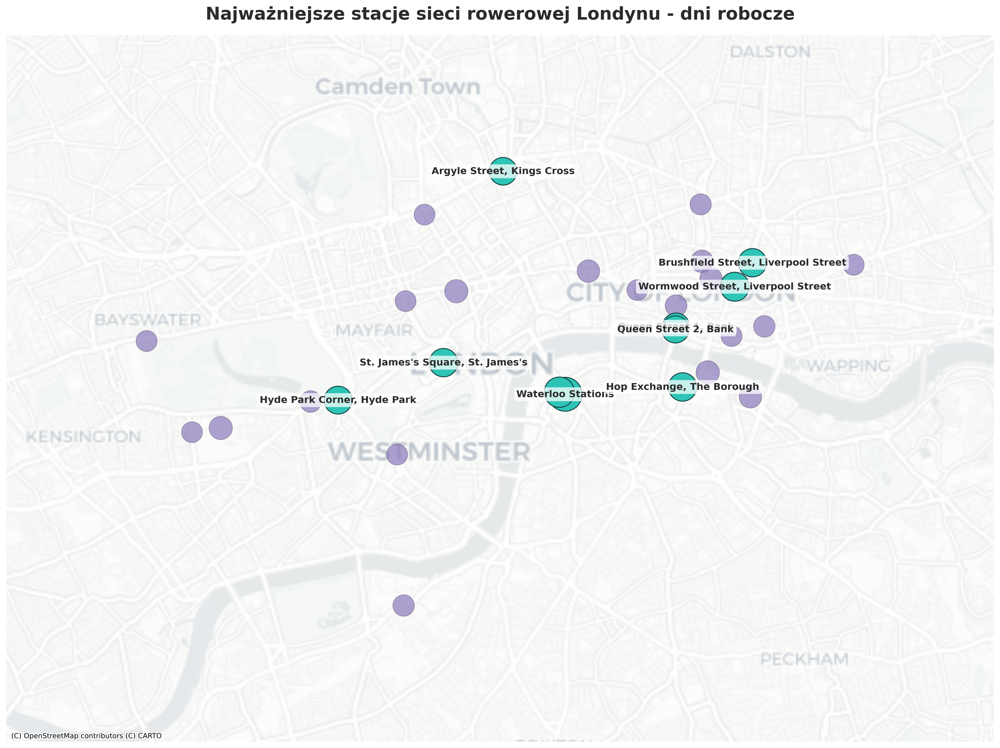

In [33]:
# ---------- Top 30 stations ----------

top_30_weekdays_indices = sorted_weekdays_indices[:30]

top_30_weekdays_names = []

for idx in top_30_weekdays_indices:

    station_id = index_to_station[idx]

    station_name = stations_weekdays_df[
        stations_weekdays_df["station_id"] == station_id
    ]["station_name"].values[0]

    top_30_weekdays_names.append(station_name)


# ---------- Top 10 stations ----------

top_10_weekdays_names = []

for idx in top_10_weekdays_stations:

    station_id = index_to_station[idx]

    station_name = stations_weekdays_df[
        stations_weekdays_df["station_id"] == station_id
    ]["station_name"].values[0]

    top_10_weekdays_names.append(station_name)


# ---------- Filtering strongest edges ----------

min_weight = 400

filtered_edges_df = edges_weekdays_df[
    (edges_weekdays_df["start_station_name"] != edges_weekdays_df["end_station_name"]) &
    (edges_weekdays_df["weight"] >= min_weight)
].copy()


# ---------- Building filtered graph ----------

filtered_graph = nx.from_pandas_edgelist(
    filtered_edges_df,
    source="start_station_name",
    target="end_station_name",
    edge_attr="weight",
    create_using=nx.DiGraph()
)


# ---------- GeoDataFrame ----------

stations_weekdays_df["lat"] = stations_weekdays_df["lat"].astype(float)
stations_weekdays_df["lon"] = stations_weekdays_df["lon"].astype(float)

geo_df = gpd.GeoDataFrame(
    stations_weekdays_df,
    geometry=gpd.points_from_xy(
        stations_weekdays_df["lon"],
        stations_weekdays_df["lat"]
    ),
    crs="EPSG:4326"
)

geo_df = geo_df.to_crs(epsg=3857)


# ---------- Positions in EPSG:3857 ----------

positions_3857 = {}

for _, row in geo_df.iterrows():

    positions_3857[row["station_name"]] = (
        row.geometry.x,
        row.geometry.y
    )


# ---------- Stationary distribution dictionary ----------

stationary_dict = {}

for idx, probability in enumerate(stationary_distribution[0]):

    station_id = index_to_station[idx]

    station_name = stations_weekdays_df[
        stations_weekdays_df["station_id"] == station_id
    ]["station_name"].values[0]

    stationary_dict[station_name] = probability


# ---------- Node sizes proportional to stationary distribution ----------

top_30_node_sizes = [
    200 + 120000 * stationary_dict[node]
    for node in top_30_weekdays_names
]

top_10_node_sizes = [
    300 + 150000 * stationary_dict[node]
    for node in top_10_weekdays_names
]


# ---------- Labels ----------

labels_to_skip = [
    "Waterloo Station 1, Waterloo",
]

labels = {}

for node in top_10_weekdays_names:

    if node in labels_to_skip:
        continue

    elif node == "Waterloo Station 3, Waterloo":
        labels[node] = "Waterloo Stations"

    else:
        labels[node] = node


# ---------- Plot style ----------

plt.rcParams["font.family"] = "DejaVu Sans"
plt.rcParams["axes.titlesize"] = 20
plt.rcParams["axes.titleweight"] = "bold"


# ---------- Drawing ----------

fig, ax = plt.subplots(figsize=(16, 12), dpi=250)


# Top 30 stations

nx.draw_networkx_nodes(
    filtered_graph,
    positions_3857,
    nodelist=top_30_weekdays_names,
    node_size=top_30_node_sizes,
    node_color="#8E7DBE",
    alpha=0.72,
    edgecolors="#2E2A3B",
    linewidths=0.35,
    ax=ax
)


# Top 10 stations highlighted

nx.draw_networkx_nodes(
    filtered_graph,
    positions_3857,
    nodelist=top_10_weekdays_names,
    node_size=top_10_node_sizes,
    node_color="#2EC4B6",
    alpha=1.0,
    edgecolors="#123C3A",
    linewidths=1.0,
    ax=ax
)


# Labels for selected top 10 stations

text_items = nx.draw_networkx_labels(
    filtered_graph,
    positions_3857,
    labels=labels,
    font_size=11,
    font_weight="bold",
    font_color="#2b2b2b",
    font_family="DejaVu Sans",
    ax=ax
)

for _, text in text_items.items():

    text.set_bbox(
        dict(
            facecolor="white",
            edgecolor="none",
            alpha=0.75,
            boxstyle="round,pad=0.25"
        )
    )


# ---------- Map extent ----------

x_values = [
    positions_3857[node][0]
    for node in top_30_weekdays_names
]

y_values = [
    positions_3857[node][1]
    for node in top_30_weekdays_names
]

ax.set_xlim(
    min(x_values) - padding,
    max(x_values) + padding
)

ax.set_ylim(
    min(y_values) - padding,
    max(y_values) + padding
)


# ---------- Basemap ----------

ctx.add_basemap(
    ax,
    source=ctx.providers.CartoDB.Positron
)

for image in ax.get_images():
    image.set_alpha(0.58)


# ---------- Title ----------

ax.set_title(
    "Najważniejsze stacje sieci rowerowej Londynu - dni robocze",
    color="#2b2b2b",
    pad=18
)

plt.axis("off")
plt.tight_layout()
plt.show()

# ---------- Duration distributions and histograms ----------


liczba_przejazdow              udzial_%         
day_type             Dni robocze  Weekendy Dni robocze Weekendy
duration_range                                                 
0-5                    1623892.0  495119.0       12.24    11.91
5-10                   3293798.0  898877.0       24.82    21.62
10-15                  2863742.0  767435.0       21.58    18.46
15-20                  2040191.0  588054.0       15.38    14.14
20-30                  2138723.0  741315.0       16.12    17.83
30-45                   879788.0  377549.0        6.63     9.08
45-60                   237005.0  146479.0        1.79     3.52
60-90                    99396.0   73686.0        0.75     1.77
90-120                   34806.0   26420.0        0.26     0.64
120+                     57525.0   42493.0        0.43     1.02

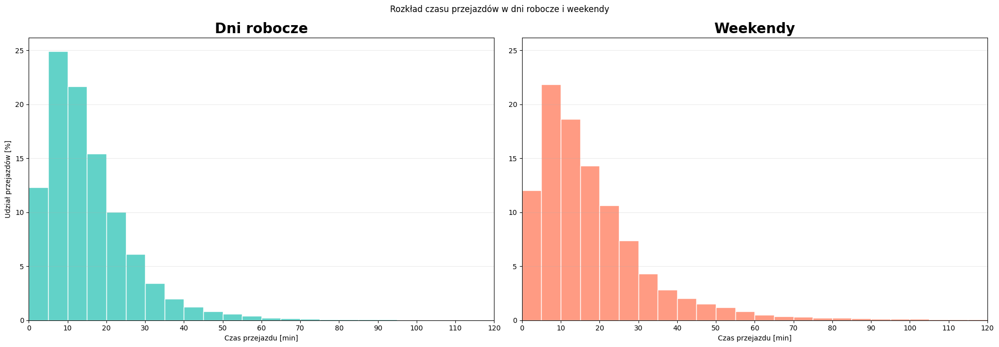

In [34]:


# ---------- Preparing data ----------

duration_distribution_data = pd.concat(
    [
        trip_data_weekdays.assign(day_type="Dni robocze"),
        trip_data_weekends.assign(day_type="Weekendy")
    ],
    ignore_index=True
)

duration_distribution_data["duration_min"] = (
    duration_distribution_data["total_duration_ms"] / 1000 / 60
)

duration_distribution_data = duration_distribution_data.dropna(
    subset=["duration_min"]
)


# ---------- Duration ranges ----------

duration_bins = [0, 5, 10, 15, 20, 30, 45, 60, 90, 120, np.inf]

duration_labels = [
    "0-5", "5-10", "10-15", "15-20", "20-30",
    "30-45", "45-60", "60-90", "90-120", "120+"
]

duration_distribution_data["duration_range"] = pd.cut(
    duration_distribution_data["duration_min"],
    bins=duration_bins,
    labels=duration_labels,
    right=False
)


# ---------- Duration distribution table ----------

duration_distribution = (
    duration_distribution_data
    .groupby(["day_type", "duration_range"], observed=False)
    .size()
    .rename("liczba_przejazdow")
    .reset_index()
)

duration_distribution["udzial_%"] = (
    duration_distribution["liczba_przejazdow"]
    / duration_distribution.groupby("day_type")["liczba_przejazdow"].transform("sum")
    * 100
)

duration_distribution_pivot = duration_distribution.pivot(
    index="duration_range",
    columns="day_type",
    values=["liczba_przejazdow", "udzial_%"]
)

display(duration_distribution_pivot.round(2))


# ---------- Histograms ----------

duration_histogram_data = duration_distribution_data[
    duration_distribution_data["duration_min"].between(0, 120)
]

fig, axes = plt.subplots(1, 2, figsize=(20, 7), sharey=True)

colors = {
    "Dni robocze": "#2EC4B6",
    "Weekendy": "#FF7A59"
}

for ax, day_type in zip(axes, colors):

    sns.histplot(
        data=duration_histogram_data[
            duration_histogram_data["day_type"] == day_type
        ],
        x="duration_min",
        bins=np.arange(0, 125, 5),
        stat="percent",
        color=colors[day_type],
        edgecolor="white",
        ax=ax
    )

    ax.set_title(day_type)
    ax.set_xlabel("Czas przejazdu [min]")
    ax.set_ylabel("Udział przejazdów [%]")
    ax.set_xlim(0, 120)
    ax.set_xticks(np.arange(0, 121, 10))
    ax.grid(axis="y", alpha=0.25)

axes[1].tick_params(axis="y", labelleft=True)

plt.suptitle("Rozkład czasu przejazdów w dni robocze i weekendy")
plt.tight_layout()

plt.show()